In [125]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torch.autograd import Variable
from tqdm import tqdm

import numpy as np
from numpy.fft import fft2, ifft2, fftshift, ifftshift


import act_max_util as amu

from autoencoder import NonLinearAutoencoder
from solver import *

In [4]:
# MNIST normalisation
transform = transforms.Compose([
    transforms.ToTensor(),  
    transforms.Normalize((0.1307,), (0.3081,))
])

mnist_test = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
test_loader = DataLoader(mnist_test, batch_size=128, shuffle=False, num_workers=6)

In [5]:
test_images = []
test_labels = []

for batch_idx, (data, target) in enumerate(test_loader):
    data = Variable(data)
    test_images.append(data)
    test_labels.append(target)

test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)
test_images = test_images.squeeze(1)

In [ ]:
def draw_circle(shape, diameter):
    assert len(shape) == 2
    TF = np.zeros(shape,dtype=np.bool)
    center = np.array(TF.shape)/2.0

    for iy in range(shape[0]):
        for ix in range(shape[1]):
            TF[iy,ix] = (iy- center[0])**2 + (ix - center[1])**2 < diameter **2
    return(TF)

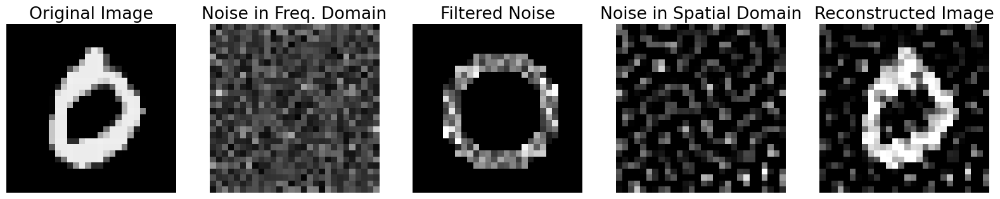

In [ ]:
sample_image = test_images[3]
noise_level = 2
circle_mask = draw_circle(shape=sample_image.shape,diameter=7)
outer_circle_mask = draw_circle(shape=sample_image.shape, diameter=10)
ring_mask = outer_circle_mask & ~circle_mask

noise = np.random.randn(*sample_image.shape)
noise_fft = np.fft.fftshift(np.fft.fft2(noise))
noise_fft_ring = noise_fft * ring_mask * noise_level
frequency_noise = np.fft.ifft2(np.fft.ifftshift(noise_fft_ring))

img = sample_image + np.real(frequency_noise)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))

axes[0].imshow(sample_image, cmap='gray', vmin=0, vmax=3)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(np.abs(noise_fft), cmap='gray', vmin=0, vmax=100)
axes[1].set_title('Noise in Freq. Domain')
axes[1].axis('off')

axes[2].imshow(np.abs(noise_fft_ring), cmap='gray', vmin=0, vmax=100)
axes[2].set_title('Filtered Noise')
axes[2].axis('off')

axes[3].imshow(np.real(frequency_noise), cmap='gray', vmin=0, vmax=3)
axes[3].set_title('Noise in Spatial Domain')
axes[3].axis('off')

axes[4].imshow((img), cmap='gray', vmin=0, vmax=3)
axes[4].set_title('Reconstructed Image')
axes[4].axis('off')

plt.show()

In [10]:
def load_model(model_path, model_type, epoch):
    n_input = 28*28
    n_layers = 3
    sae_n_hidden_ls = [512, 128, 32]

    size_ls = [4, 4, 4, 4, 4, 10,
            10, 10, 10, 10, 16, 16,
            16, 16, 16, 16, 16, 24,
            24, 24, 24, 24, 24, 24, 
            32, 32, 32, 32, 32, 32,
            32, 32, 32, 32, 32, 32, 
            32, 32, 32, 32, 32, 32, 
            32, 32, 32, 32, 32, 32, 
            32, 32, 32, 32, 32, 32,
            32, 32, 32, 32, 32, 32]
    
    dae_n_hidden_ls = [512, 128, size_ls[epoch]]
    
    if model_type == 'sae':
        model = NonLinearAutoencoder(n_input, sae_n_hidden_ls, n_layers)
    else:
        model = NonLinearAutoencoder(n_input, dae_n_hidden_ls, n_layers)
    weights = torch.load(f"{model_path}/model_weights_epoch{epoch}.pth")
    model.load_state_dict(weights)
    return model

In [11]:
sae_model = load_model('/home/david/mnist_model/sae/0', 'sae', 49)
dae_model = load_model('/home/david/mnist_model/dae/0', 'dae', 49)

/tmp/ipykernel_5806/4008335561.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weights = torch.load(f"{model_path}/model_weights_epoch{epoch}.pth")


In [12]:
def add_frequency_noise(image, noise_level=1, inner_diameter=3, outer_diameter=7):
    circle_mask         = draw_circle(shape=image.shape,diameter=inner_diameter)
    outer_circle_mask   = draw_circle(shape=image.shape, diameter=outer_diameter)
    ring_mask           = outer_circle_mask & ~circle_mask

    noise = np.random.randn(*image.shape)
    noise_fft = np.fft.fftshift(np.fft.fft2(noise))
    noise_fft_ring = noise_fft * ring_mask * noise_level
    frequency_noise = np.fft.ifft2(np.fft.ifftshift(noise_fft_ring))

    img = image + np.real(frequency_noise)

    return img

In [13]:
def cut_frequencies(image, diameter):
    fft_img = np.fft.fftshift(np.fft.fft2(image))

    mask = ~draw_circle(shape=sample_image.shape, diameter=diameter)
    fft_img = fft_img * mask

    img = np.fft.ifft2(np.fft.ifftshift(fft_img))

    return img

In [57]:
def single_frequency(image, radial_frequency):
    circle_mask = draw_circle(shape=image.shape,diameter=radial_frequency)
    outer_circle_mask = draw_circle(shape=image.shape, diameter=radial_frequency+1)
    ring_mask = outer_circle_mask & ~circle_mask

    fft_img = np.fft.fftshift(np.fft.fft2(image))
    fft_img = fft_img * ring_mask
    img = np.fft.ifft2(np.fft.ifftshift(fft_img))

    return np.abs(img)

In [25]:
noisy_images = np.zeros((1000, 21, 28, 28))

for idx in range(1000):
    original_image = test_images[idx]
    for freq in range(21):
        if freq == 20:
            noisy_image = original_image
        else:
            noisy_image = single_frequency(original_image, freq)
        noisy_images[idx, freq] = noisy_image

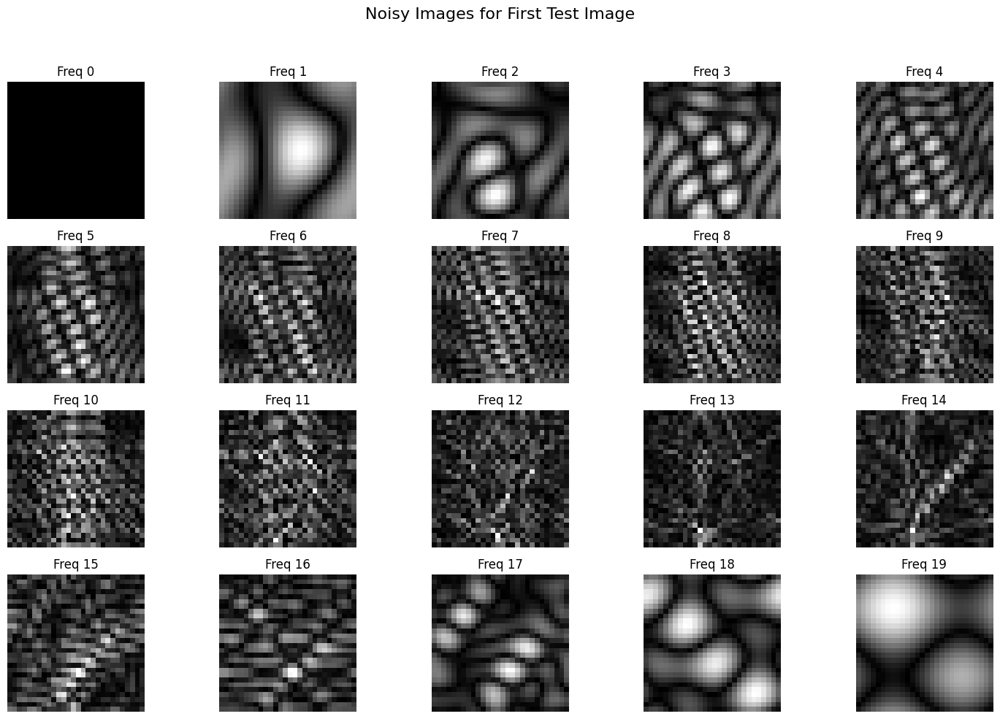

In [31]:
fig, axs = plt.subplots(4, 5, figsize=(15, 10))
fig.suptitle('Noisy Images for First Test Image', fontsize=16)

for freq in range(20):
    row, col = divmod(freq, 5)
    axs[row, col].imshow(noisy_images[0, freq], cmap='gray')
    axs[row, col].set_title(f'Freq {freq}')
    axs[row, col].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [97]:
all_average_encodings = np.zeros((20, 21, 32))

noisy_images_tensor = torch.tensor(noisy_images, dtype=torch.float32).to('cpu')

for i in range(20):
    model_path = f'/home/david/mnist_model/dae/{i}'
    dae_model = load_model(model_path, 'dae', 59)
    dae_model.eval()

    average_encodings = np.zeros((21, 32))

    # Average encoding for each frequency
    for freq in range(21):
        encodings = []
        for img_idx in range(1000):
            image = noisy_images_tensor[img_idx, freq].view(-1)
            with torch.no_grad():
                encoding = dae_model.encode(image)
            encodings.append(encoding.cpu().numpy())

        # Average encoding for one frequency
        encodings = np.array(encodings).squeeze()
        average_encodings[freq] = np.mean(encodings, axis=0)

    all_average_encodings[i] = average_encodings

final_average_encodings = np.mean(all_average_encodings, axis=0)

/tmp/ipykernel_5806/4008335561.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weights = torch.load(f"{model_path}/model_weights_epoch{epoch}.pth")


In [179]:
def min_max_normalize(arr):
    return (arr - np.min(arr)) / (np.max(arr) - np.min(arr))

/tmp/ipykernel_5806/2051419344.py:2: RuntimeWarning: invalid value encountered in divide
  return (arr - np.min(arr)) / (np.max(arr) - np.min(arr))


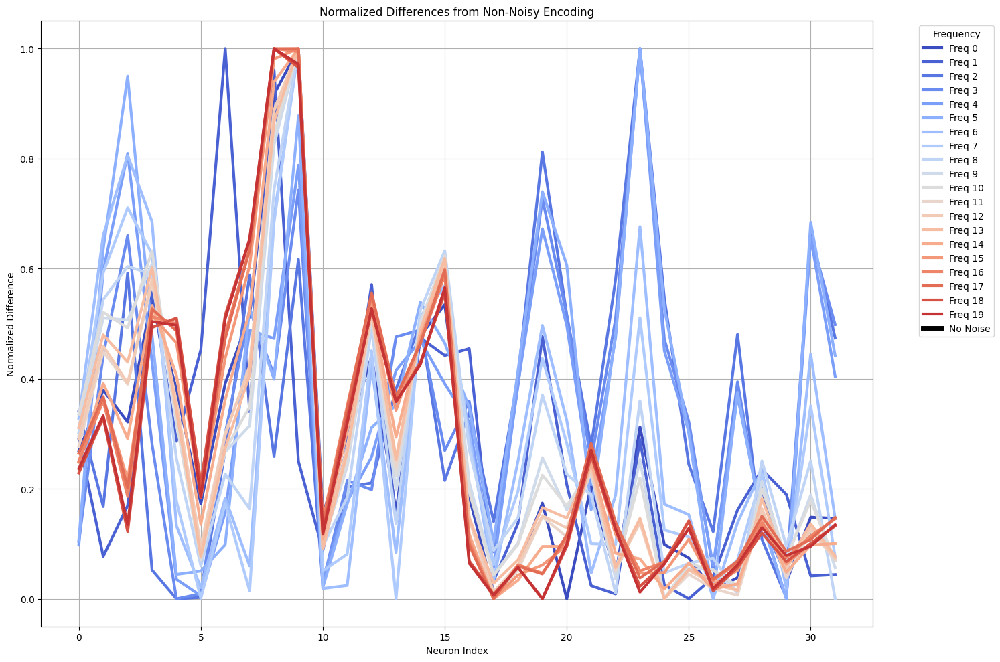

In [98]:
normalized_differences = np.zeros((21, 32))

for i in range(21):
    normalized_differences[i] = min_max_normalize(np.abs(min_max_normalize(final_average_encodings[i]) - min_max_normalize(final_average_encodings[20])))

colors = plt.cm.coolwarm(np.linspace(0, 1, 21))

plt.figure(figsize=(15, 10))

for freq in range(21):
    if freq == 20:
        plt.plot(normalized_differences[freq], label='No Noise', color='black', linewidth=5)
    else:
        plt.plot(normalized_differences[freq], label=f'Freq {freq}', color=colors[freq], linewidth=3)

plt.xlabel('Neuron Index')
plt.ylabel('Normalized Difference from unaltered Image')
plt.title('Effect of Frequency on Neuron Activation')
plt.legend(title='Frequency', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()

plt.show()

In [109]:
sae_encodings_all = []
dae_encodings_all = []

for i in tqdm(range(20), desc="Model Loading"):
    sae_model = load_model(f'/home/david/mnist_model/sae/{i}/', 'sae', 59)
    dae_model = load_model(f'/home/david/mnist_model/dae/{i}/', 'dae', 59)

    sae_encodings = []
    dae_encodings = []

    for j in tqdm(range(len(test_images)), desc=f"Encoding Images for Model {i}", leave=False):
        sae_encodings.append(abs(sae_model.encode(torch.tensor(test_images[j]).view(-1).float()).detach()))
        dae_encodings.append(abs(dae_model.encode(torch.tensor(test_images[j]).view(-1).float()).detach()))

    sae_mean_encoding = np.mean(sae_encodings, axis=0)[0]
    dae_mean_encoding = np.mean(dae_encodings, axis=0)[0]

    sae_encodings_all.append(sae_mean_encoding)
    dae_encodings_all.append(dae_mean_encoding)

sae_encodings_all_mean = np.mean(sae_encodings_all, axis=0)
dae_encodings_all_mean = np.mean(dae_encodings_all, axis=0)
sae_encodings_all_std = np.std(sae_encodings_all, axis=0)
dae_encodings_all_std = np.std(dae_encodings_all, axis=0)

Model Loading:   0%|          | 0/20 [00:00<?, ?it/s]/tmp/ipykernel_5806/4008335561.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weights = torch.load(f"{model_path}/

In [111]:
sae_encodings_all = []
dae_encodings_all = []

for i in tqdm(range(20), desc="Model Loading"):
    sae_model = load_model(f'/home/david/mnist_model/sae/{i}/', 'sae', 59)
    dae_model = load_model(f'/home/david/mnist_model/dae/{i}/', 'dae', 59)

    sae_encodings = []
    dae_encodings = []

    for j in tqdm(range(len(test_images)), desc=f"Encoding Images for Model {i}", leave=False):
        sae_encodings.append(sae_model.encode(torch.tensor(test_images[j]).view(1, -1).float()).detach())
        dae_encodings.append(dae_model.encode(torch.tensor(test_images[j]).view(1, -1).float()).detach())

    sae_encodings_all.append(sae_encodings)
    dae_encodings_all.append(dae_encodings)

Model Loading:   0%|          | 0/20 [00:00<?, ?it/s]/tmp/ipykernel_5806/4008335561.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weights = torch.load(f"{model_path}/

/tmp/ipykernel_5806/2620278171.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


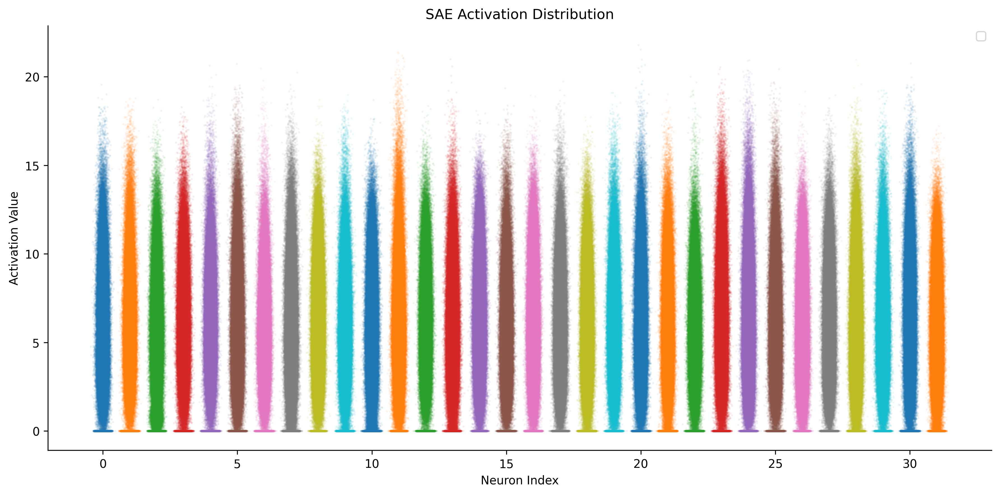

In [122]:
data = np.array(sae_encodings_all).squeeze()

n_arrays, n_points, n_neurons = data.shape

fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

for neuron in range(n_neurons):
    y_vals = data[:, :, neuron].flatten() # Flatten data per neuron for all arrays
    x_vals = np.random.normal(loc=neuron, scale=0.1, size=y_vals.shape) # Add jitter    
    ax.scatter(x_vals, y_vals, s=1, alpha=0.05)

ax.set_xlabel('Neuron Index')
ax.set_ylabel('Activation Value')
ax.set_title('SAE Activation Distribution')

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

/tmp/ipykernel_5806/77690571.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


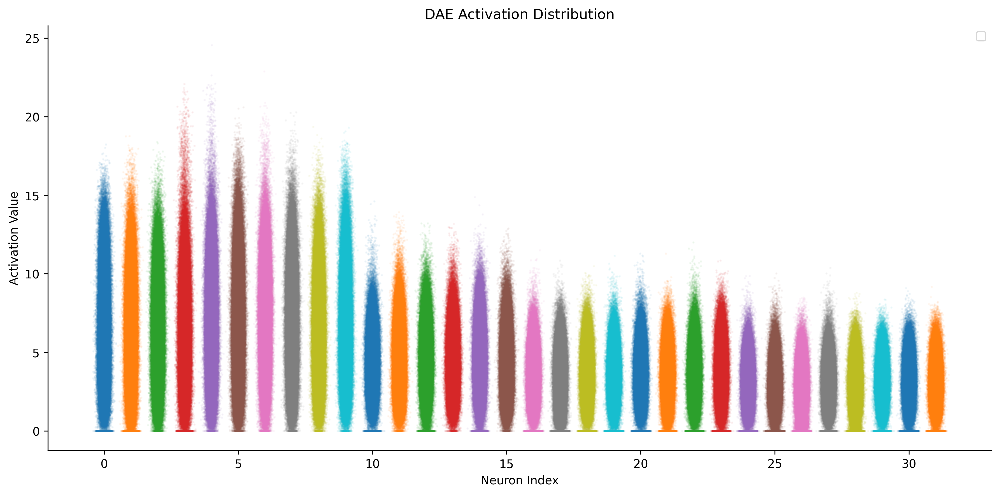

In [ ]:
data = np.array(dae_encodings_all).squeeze()

n_arrays, n_points, n_neurons = data.shape

fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

for neuron in range(n_neurons):
    y_vals = data[:, :, neuron].flatten() # Flatten data per neuron for all arrays
    x_vals = np.random.normal(loc=neuron, scale=0.1, size=y_vals.shape)
    ax.scatter(x_vals, y_vals, s=1, alpha=0.05)

ax.set_xlabel('Neuron Index')
ax.set_ylabel('Activation Value')
ax.set_title('DAE Activation Distribution')

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

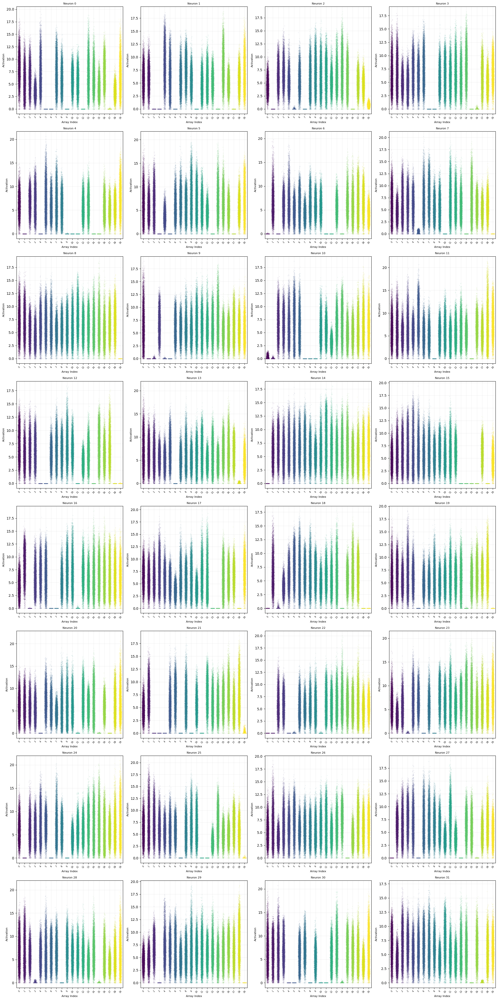

In [ ]:
data = np.array(sae_encodings_all).squeeze()

n_arrays, n_samples, n_neurons = data.shape
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=0, vmax=n_arrays-1)

fig, axes = plt.subplots(8, 4, figsize=(20, 40))
axes = axes.flatten()

for neuron_idx in range(n_neurons):
    ax = axes[neuron_idx]
    for array_idx in range(n_arrays):
        activations = data[array_idx, :, neuron_idx]
        x = np.random.normal(array_idx, 0.1, size=n_samples)
        color = cmap(norm(array_idx))
        ax.scatter(x, activations, alpha=0.1, s=1, color=color, rasterized=True)
    
    ax.set_title(f'Neuron {neuron_idx}', fontsize=8)
    ax.set_xlabel('Array Index', fontsize=8)
    ax.set_ylabel('Activation', fontsize=8)
    ax.set_xticks(np.arange(n_arrays))
    ax.set_xticklabels(np.arange(n_arrays), rotation=45, fontsize=6)
    ax.set_xlim(-0.5, n_arrays - 0.5)
    ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('neuron_activations.png', dpi=300, bbox_inches='tight')
plt.show()

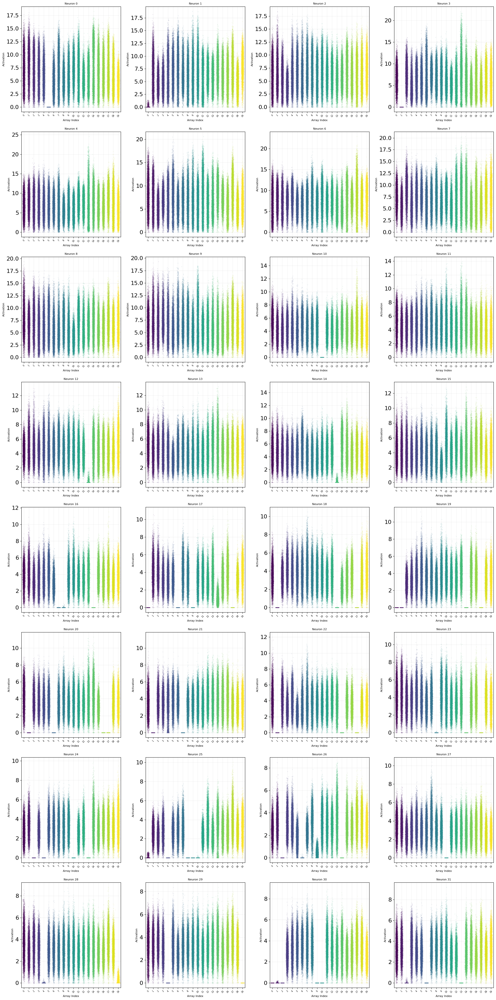

In [ ]:
data = np.array(dae_encodings_all).squeeze()

n_arrays, n_samples, n_neurons = data.shape
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=0, vmax=n_arrays-1)

fig, axes = plt.subplots(8, 4, figsize=(20, 40))
axes = axes.flatten()

for neuron_idx in range(n_neurons):
    ax = axes[neuron_idx]
    for array_idx in range(n_arrays):
        activations = data[array_idx, :, neuron_idx]
        x = np.random.normal(array_idx, 0.1, size=n_samples)
        color = cmap(norm(array_idx))
        ax.scatter(x, activations, alpha=0.1, s=1, color=color, rasterized=True)
    
    ax.set_title(f'Neuron {neuron_idx}', fontsize=8)
    ax.set_xlabel('Array Index', fontsize=8)
    ax.set_ylabel('Activation', fontsize=8)
    ax.set_xticks(np.arange(n_arrays))
    ax.set_xticklabels(np.arange(n_arrays), rotation=45, fontsize=6)
    ax.set_xlim(-0.5, n_arrays - 0.5)
    ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('neuron_activations.png', dpi=300, bbox_inches='tight')
plt.show()

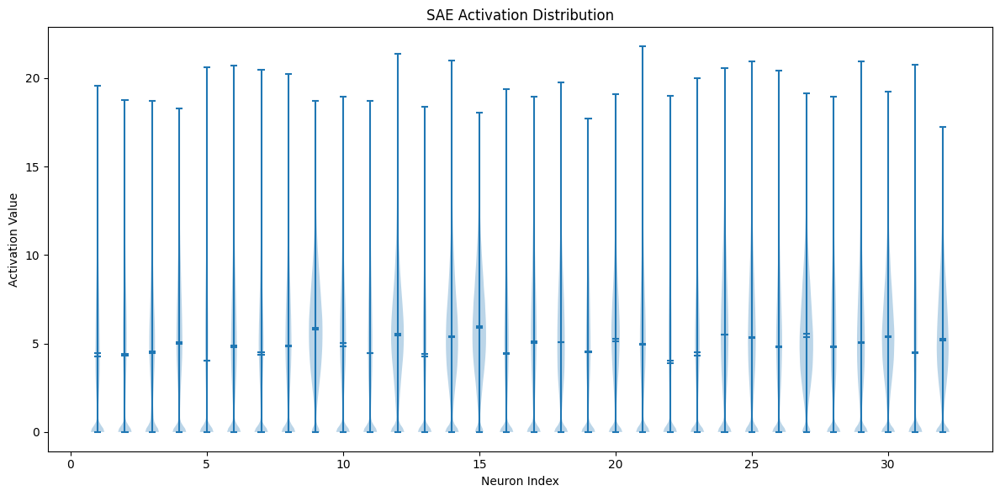

In [128]:
data = np.array(sae_encodings_all).squeeze()

data_reshaped = data.reshape(-1, 32)

neuron_data = [data_reshaped[:, i] for i in range(data_reshaped.shape[1])]

fig, ax = plt.subplots(figsize=(12, 6))
parts = ax.violinplot(neuron_data, showmeans=True, showmedians=True)
ax.set_xlabel('Neuron Index')
ax.set_ylabel('Activation Value')
ax.set_title('SAE Activation Distribution')
plt.tight_layout()
plt.show()

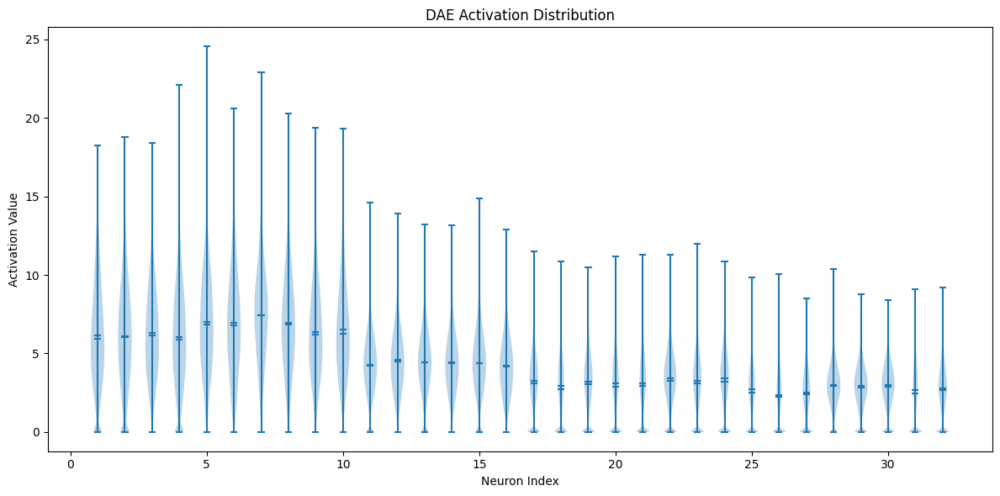

In [127]:
data = np.array(dae_encodings_all).squeeze()

data_reshaped = data.reshape(-1, 32)

neuron_data = [data_reshaped[:, i] for i in range(data_reshaped.shape[1])]

fig, ax = plt.subplots(figsize=(12, 6))
parts = ax.violinplot(neuron_data, showmeans=True, showmedians=True)
ax.set_xlabel('Neuron Index')
ax.set_ylabel('Activation Value')
ax.set_title('DAE Activation Distribution')
plt.tight_layout()
plt.show()


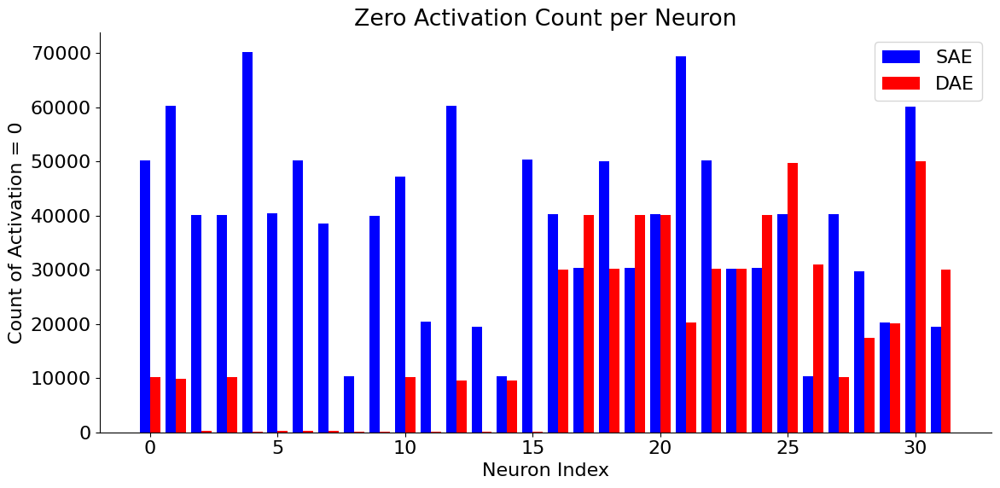

In [135]:
data1 = np.array(sae_encodings_all).squeeze()
data2 = np.array(dae_encodings_all).squeeze()

zero_counts1 = (data1 == 0).sum(axis=(0, 1))
zero_counts2 = (data2 == 0).sum(axis=(0, 1))

neurons = np.arange(32)

plt.rc('font', size=16)
plt.figure(figsize=(12, 6))

bar_width = 0.4

plt.bar(neurons - bar_width/2, zero_counts1, color='blue', width=bar_width, label='SAE')
plt.bar(neurons + bar_width/2, zero_counts2, color='red', width=bar_width, label='DAE')

plt.xlabel('Neuron Index')
plt.ylabel('Count of Activation = 0')
plt.title('Zero Activation Count per Neuron')
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


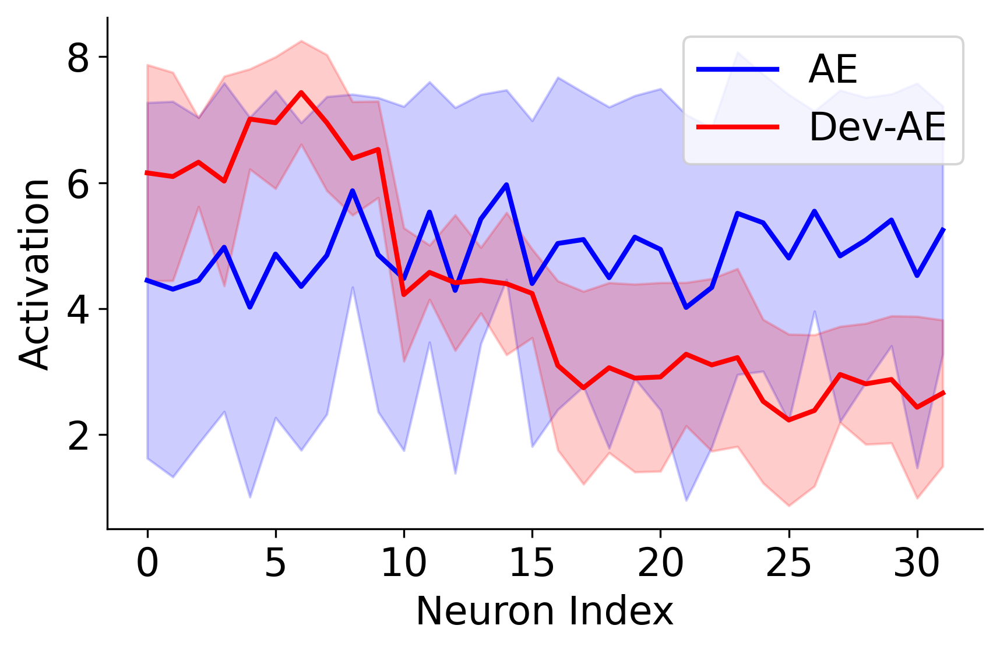

In [ ]:
plt.rc('font', size=16)
plt.figure(figsize=(6, 4), dpi=300)

x = np.arange(len(sae_encodings_all_mean))

plt.plot(x, sae_encodings_all_mean, label='AE', color='blue', linewidth=2)
plt.fill_between(x, 
                 sae_encodings_all_mean - sae_encodings_all_std, 
                 sae_encodings_all_mean + sae_encodings_all_std, 
                 color='blue', alpha=0.2)

x = np.arange(len(dae_encodings_all_mean))
plt.plot(x, dae_encodings_all_mean, label='Dev-AE', color='red', linewidth=2)
plt.fill_between(x, 
                 dae_encodings_all_mean - dae_encodings_all_std, 
                 dae_encodings_all_mean + dae_encodings_all_std, 
                 color='red', alpha=0.2)

plt.xlabel('Neuron Index')
plt.ylabel('Activation')

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('Plots_svg/accuracy_over_parameters.svg', bbox_inches='tight', dpi=300)
plt.savefig('Plots_png/accuracy_over_parameters.png', bbox_inches='tight', dpi=300)
plt.show()